<a href="https://colab.research.google.com/github/pachterlab/CWGFLHGCCHAP_2021/blob/master/notebooks/Preprocessing/ClickTagDemultiplexing/kallistobusStimClickTags.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Download Data**

In [ ]:
#Install kallisto and bustools

!wget --quiet https://github.com/pachterlab/kallisto/releases/download/v0.46.2/kallisto_linux-v0.46.2.tar.gz
!tar -xf kallisto_linux-v0.46.2.tar.gz
!cp kallisto/kallisto /usr/local/bin/

!wget --quiet https://github.com/BUStools/bustools/releases/download/v0.40.0/bustools_linux-v0.40.0.tar.gz
!tar -xf bustools_linux-v0.40.0.tar.gz
!cp bustools/bustools /usr/local/bin/

In [ ]:
import requests
from tqdm import tnrange, tqdm_notebook
def download_file(doi,ext):
    url = 'https://api.datacite.org/dois/'+doi+'/media'
    r = requests.get(url).json()
    netcdf_url = r['data'][0]['attributes']['url']
    r = requests.get(netcdf_url,stream=True)
    #Set file name
    fname = doi.split('/')[-1]+ext
    #Download file with progress bar
    if r.status_code == 403:
        print("File Unavailable")
    if 'content-length' not in r.headers:
        print("Did not get file")
    else:
        with open(fname, 'wb') as f:
            total_length = int(r.headers.get('content-length'))
            pbar = tnrange(int(total_length/1024), unit="B")
            for chunk in r.iter_content(chunk_size=1024):
                if chunk:
                    pbar.update()
                    f.write(chunk)
        return fname

In [ ]:
#Get HiSeq/MiSeq sequencing of ClickTags

download_file('10.22002/D1.1793','.tar.gz')
!tar -xf  D1.1793.tar.gz


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`


In [ ]:
# Get ClickTag Barcodes/Sequences
download_file('10.22002/D1.1831','.gz')

#Get saved embedding of ClickTags
download_file('10.22002/D1.1838','.gz')

!gunzip *.gz

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`


In [ ]:
!pip install --quiet anndata
!pip install --quiet scanpy
!pip3 install --quiet leidenalg
!pip install --quiet louvain
!pip3 install --quiet biopython

     |████████████████████████████████| 122kB 4.9MB/s 
     |████████████████████████████████| 7.7MB 4.0MB/s 
     |████████████████████████████████| 71kB 9.4MB/s 
     |████████████████████████████████| 51kB 6.8MB/s 
     |████████████████████████████████| 2.4MB 4.2MB/s 
     |████████████████████████████████| 3.2MB 32.8MB/s 
     |████████████████████████████████| 2.2MB 4.3MB/s 
     |████████████████████████████████| 2.3MB 4.0MB/s 


### **Import Packages**

In [ ]:
import pandas as pd
import copy
from sklearn.preprocessing import LabelEncoder
from scipy import sparse
import scipy
import numpy as np
import anndata
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc

from collections import OrderedDict
from Bio import SeqIO
import os
from scipy import io
import scipy.io as sio
import time


%matplotlib inline
%config InlineBackend.figure_format = 'retina'



### **How ClickTag counts and Clustering Are Generated**

Use kallisto-bustools to align reads to kallisto index of ClickTag barcode whitelist consisting of sequences hamming distance 1 away from original barcodes

In [ ]:
## Set parameters - below are parameters for 10x 3' v3 chemistry
## The cell hashing method uses tags of length 12, we included the variable B (T,C,G) in the end to make it lenght 13
cell_barcode_length = 16
UMI_length = 12
sample_tag_length=11

"""
This function returns all sample tags and and their single base mismatches (hamming distance 1).
ClickTag sequences are provided as a fasta file, and the script indexes the barcode region of the fasta
"""

"parse the tags file and output the set of tag sequences"

def parse_tags(filename):
    odict = OrderedDict()
    print('Read the following tags:')
    for record in SeqIO.parse(filename, "fasta"):
        counter=0
        print(record.seq)
        odict[record.name] = str(record.seq)[26:26+sample_tag_length]
        for pos in range(sample_tag_length):
            letter =str(record.seq)[26+pos]
            barcode=list(str(record.seq)[26:26+sample_tag_length])
            if letter=='A':
                barcode[pos]='T'
                odict[record.name+'-'+str(pos)+'-1'] = "".join(barcode)
                barcode[pos]='G'
                odict[record.name+'-'+str(pos)+'-2'] = "".join(barcode)
                barcode[pos]='C'
                odict[record.name+'-'+str(pos)+'-3'] = "".join(barcode)
            elif letter=='G':
                barcode[pos]='T'
                odict[record.name+'-'+str(pos)+'-1'] = "".join(barcode)
                barcode[pos]='A'
                odict[record.name+'-'+str(pos)+'-2'] = "".join(barcode)
                barcode[pos]='C'
                odict[record.name+'-'+str(pos)+'-3'] = "".join(barcode)
            elif letter=='C':
                barcode[pos]='T'
                odict[record.name+'-'+str(pos)+'-1'] = "".join(barcode)
                barcode[pos]='G'
                odict[record.name+'-'+str(pos)+'-2'] = "".join(barcode)
                barcode[pos]='A'
                odict[record.name+'-'+str(pos)+'-3'] = "".join(barcode)
            else:
                barcode[pos]='A'
                odict[record.name+'-'+str(pos)+'-1'] = "".join(barcode)
                barcode[pos]='G'
                odict[record.name+'-'+str(pos)+'-2'] = "".join(barcode)
                barcode[pos]='C'
                odict[record.name+'-'+str(pos)+'-3'] = "".join(barcode)
                
    return odict



In [ ]:
# Make kallisto index from ClickTag sequences

!mv D1.1831 70BPbarcodes.fa
tags_file_path = ("70BPbarcodes.fa") #70BPbarcodes.fa
tag_map=parse_tags(tags_file_path)


work_folder = ''
data_folder = ''#/home/jgehring/scRNAseq/clytia/20190405/all_tag_fastqs//
write_folder = ''

#Write the list of barcodes as a fasta, then make a kallisto index
!mkdir barcode_corrected_tags
tagmap_file_path = "barcode_corrected_tags/70BPbarcodes_tagmap.fa"

tagmap_file = open(tagmap_file_path, "w+")
for i in list(tag_map.keys()):
    tagmap_file.write(">" + i + "\n" +tag_map[i] + "\n")
tagmap_file.close()

!kallisto index -i {tagmap_file_path}.idx -k 11 {tagmap_file_path}
!kallisto inspect {tagmap_file_path}.idx


Run kallisto bus on ClickTag fastqs

In [ ]:
#Run kallisto bus on ClickTag fastqs

!mkdir jelly4stim_1_tags_HiSeq

write_folder = 'jelly4stim_1_tags_HiSeq'

!kallisto bus -i {tagmap_file_path}.idx -o {write_folder} -x 10xv3 -t 20 {os.path.join(data_folder,'jelly4stim1MiSeqHiSeq_tags_R1.fastq')} {os.path.join(data_folder,'jelly4stim1MiSeqHiSeq_tags_R2.fastq')}

#sort bus file
!bustools sort -o {os.path.join(write_folder,'output_sorted.bus')} {os.path.join(write_folder,'output.bus')}

# convert the sorted busfile to txt
!bustools text -o {os.path.join(write_folder,'output_sorted.txt')} {os.path.join(write_folder,'output_sorted.bus')}


!mkdir jelly4stim_2_tags_HiSeq

write_folder = 'jelly4stim_2_tags_HiSeq'

!kallisto bus -i {tagmap_file_path}.idx -o {write_folder} -x 10xv3 -t 20 {os.path.join(data_folder,'jelly4stim2MiSeqHiSeq_tags_R1.fastq')} {os.path.join(data_folder,'jelly4stim2MiSeqHiSeq_tags_R2.fastq')} \

#sort bus file
!bustools sort -o {os.path.join(write_folder,'output_sorted.bus')} {os.path.join(write_folder,'output.bus')}

# convert the sorted busfile to txt
!bustools text -o {os.path.join(write_folder,'output_sorted.txt')} {os.path.join(write_folder,'output_sorted.bus')}


mkdir: cannot create directory ‘jelly4stim_1_tags_HiSeq’: File exists
mv: cannot stat 'tw7h9xi94348gsultf0owb6q4mp1ehlf': No such file or directory
mv: cannot stat 'bmu19su5ouc6vze3p00pobb665q1pi3z': No such file or directory

[index] k-mer length: 11
[index] number of targets: 680
[index] number of k-mers: 680
[index] number of equivalence classes: 680
[quant] will process sample 1: jelly4stim1MiSeqHiSeq_tags_R1.fastq
                               jelly4stim1MiSeqHiSeq_tags_R2.fastq
[quant] finding pseudoalignments for the reads ... done
[quant] processed 16,904,784 reads, 8,500,027 reads pseudoaligned

Read in 8500027 BUS records
Read in 7801303 BUS records
mkdir: cannot create directory ‘jelly4stim_2_tags_HiSeq’: File exists
mv: cannot stat 'pmsgi1o664n5gynqggnulstje1djxcwb': No such file or directory
mv: cannot stat '6ogvqwclzev3dsri2zv46yqrlutucrl1': No such file or directory

[index] k-mer length: 11
[index] number of targets: 680
[index] number of k-mers: 680
[index] number of 

In [ ]:
write_folder = '' #/home/jgehring/scRNAseq/clytia/20190405/

bus_data_jelly1 = pd.read_csv(os.path.join(write_folder,'jelly4stim_1_tags_HiSeq/output_sorted.txt'), delimiter='\t', header=None, names = ['barcode', 'umi', 'tag_eqclass', 'multiplicity'])
bus_data_jelly1.head()

bus_data_jelly1

bus_data_jelly2 = pd.read_csv(os.path.join(write_folder,'jelly4stim_2_tags_HiSeq/output_sorted.txt'), delimiter='\t', header=None, names = ['barcode', 'umi', 'tag_eqclass', 'multiplicity'])
bus_data_jelly2.head()

tag_map_df = pd.DataFrame.from_dict(tag_map, orient = 'index').reset_index()
tag_map_df.columns=['tagname','tagseq']
tag_map_df['ClickTag'] = tag_map_df['tagname'].str.split('-').str.get(0)
tag_map_df.head()

bus_data_jelly1['tag']= bus_data_jelly1['tag_eqclass'].map(tag_map_df['ClickTag'])
bus_data_jelly1.head()

bus_data_jelly2['tag']= bus_data_jelly2['tag_eqclass'].map(tag_map_df['ClickTag'])
bus_data_jelly2.head()



print('Counting UMIs')
counted_data_jelly1 = bus_data_jelly1.groupby(['barcode', 'tag'])['umi'].count().reset_index()
counted_data_jelly1.rename(columns={'umi':'umi_counts'}, inplace = True)
counted_data_jelly1.head()

print('Counting UMIs')
counted_data_jelly2 = bus_data_jelly2.groupby(['barcode', 'tag'])['umi'].count().reset_index()
counted_data_jelly2.rename(columns={'umi':'umi_counts'}, inplace = True)
counted_data_jelly2.head()



Counting UMIs
Counting UMIs


,barcode,tag,umi_counts
0,AAAAAAAAAAAAAAAA,BC_36,1
1,AAAAACAGCTACGTTT,BC_38,1
2,AAAAACAGGCACTAGT,BC_30,1
3,AAAAACATTTTTTTTT,BC_38,1
4,AAAAACCACATGAAAA,BC_38,1


In [ ]:
!mkdir counted_tag_data

mkdir: cannot create directory ‘counted_tag_data’: File exists


In [ ]:
data_dict={'counted_data_jelly1':counted_data_jelly1, 'counted_data_jelly2':counted_data_jelly2}
counted_data_jelly1['barcode']=[x+'-1' for x in counted_data_jelly1['barcode'].values]
counted_data_jelly2['barcode']=[x+'-2' for x in counted_data_jelly2['barcode'].values]



for counted_data in data_dict:

    le_barcode = LabelEncoder()
    barcode_idx =le_barcode.fit_transform(data_dict[counted_data]['barcode'].values)
    print('Barcode index shape:', barcode_idx.shape)

    le_umi = LabelEncoder()
    umi_idx = le_umi.fit_transform(data_dict[counted_data]['umi_counts'].values)
    print('UMI index shape:', umi_idx.shape)

    le_tag = LabelEncoder()
    tag_idx = le_tag.fit_transform(data_dict[counted_data]['tag'].values)
    print('Tag index shape:', tag_idx.shape)
    
    # convert data to csr matrix
    csr_matrix_data = scipy.sparse.csr_matrix((data_dict[counted_data]['umi_counts'].values,(barcode_idx,tag_idx)))
    
    
    scipy.io.mmwrite(os.path.join(write_folder,'counted_tag_data/' + counted_data + '.mtx'),csr_matrix_data)
    print('Saved sparse csr matrix')
    
    pd.DataFrame(le_tag.classes_).to_csv(os.path.join(write_folder,'counted_tag_data/' + counted_data + '_ClickTag_tag_labels.csv'), index = False, header = False)
    pd.DataFrame(le_barcode.classes_).to_csv(os.path.join(write_folder,'counted_tag_data/' + counted_data + '_ClickTag_barcode_labels.csv'), index = False, header = False)
    print('Saved cell barcode and hashtag labels')
    print('Number of unique cell barcodes seen:', len(le_barcode.classes_))



Barcode index shape: (1853354,)
UMI index shape: (1853354,)
Tag index shape: (1853354,)
Saved sparse csr matrix
Saved cell barcode and hashtag labels
Number of unique cell barcodes seen: 439363
Barcode index shape: (977213,)
UMI index shape: (977213,)
Tag index shape: (977213,)
Saved sparse csr matrix
Saved cell barcode and hashtag labels
Number of unique cell barcodes seen: 202035


In [ ]:
# Clicktag for both 10x lanes concatenated

ClickTagCountsmat=scipy.io.mmread(os.path.join(write_folder,'counted_tag_data/counted_data_jelly1.mtx'))
ClickTagCounts=pd.DataFrame(ClickTagCountsmat.toarray(), 
                            index=list(pd.read_csv(os.path.join(write_folder,'counted_tag_data/counted_data_jelly1_ClickTag_barcode_labels.csv'), header=None).loc[:,0]),
                            columns=list(pd.read_csv(os.path.join(write_folder,'counted_tag_data/' + counted_data + '_ClickTag_tag_labels.csv'), header=None).loc[:,0]))

ClickTagCountsmat=scipy.io.mmread(os.path.join(write_folder,'counted_tag_data/counted_data_jelly2.mtx'))
ClickTagCounts=ClickTagCounts.append(pd.DataFrame(ClickTagCountsmat.toarray(), 
                            index=list(pd.read_csv(os.path.join(write_folder,'counted_tag_data/counted_data_jelly2_ClickTag_barcode_labels.csv'), header=None).loc[:,0]),
                            columns=list(pd.read_csv(os.path.join(write_folder,'counted_tag_data/' + counted_data + '_ClickTag_tag_labels.csv'), header=None).loc[:,0])))


ClickTagCounts



,BC_21,BC_22,BC_23,BC_24,BC_25,BC_26,BC_27,BC_28,BC_29,BC_30,BC_31,BC_32,BC_33,BC_34,BC_35,BC_36,BC_37,BC_38,BC_39,BC_40
AAAAAAAGTTTGAATT-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
AAAAAACGTTTTGGCC-1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
AAAAACGTCGCAGTCC-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
AAAAACGTTGTGGCCT-1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
AAAAATCTTTTTTTTT-1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTTTTGAGGCTCTAT-2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
TTTTTTGCAGAATGTA-2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
TTTTTTTTTAACATCC-2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
TTTTTTTTTTGTTTTT-2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Use UMI count knee-plot to filter for high-quality ClickTagged cells

In [ ]:
ClickTag_counts_sorted = copy.deepcopy(ClickTagCounts.T.sum())
ClickTag_counts_sorted = ClickTag_counts_sorted.sort_values(ascending=False)
plt.plot(ClickTag_counts_sorted.apply(np.log10),np.log10(range(len(ClickTag_counts_sorted))))
plt.axhline(np.log10(50000))
plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until


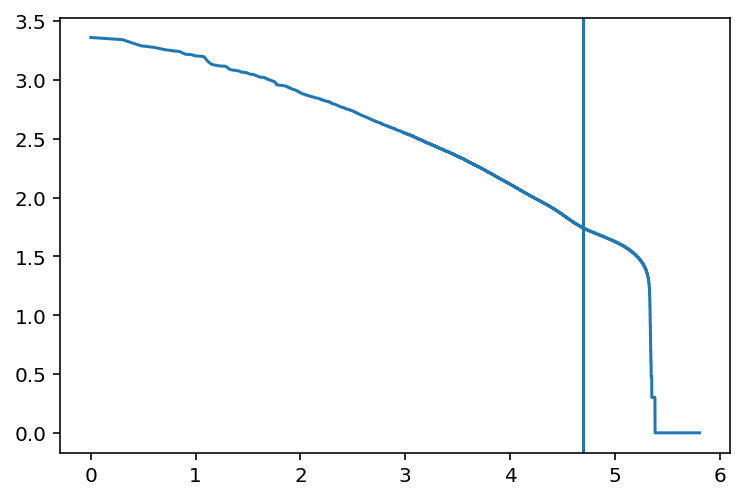

In [ ]:


ClickTag_counts_filtered=ClickTagCounts.loc[list(ClickTag_counts_sorted[:50000].index)]
ClickTag_counts_filtered=ClickTag_counts_filtered.iloc[:,4:]
filtered_ClickTag_counts=ClickTag_counts_filtered.T
filtered_ClickTag_counts



hits = 0
counter = 1
for barcode in filtered_ClickTag_counts.index:
    for i in filtered_ClickTag_counts:    
        if filtered_ClickTag_counts[i].idxmax() == barcode:
            if hits ==0:
                sortedheatmap_dtf=pd.DataFrame({counter:filtered_ClickTag_counts[i]})
                hits+=1
                counter+=1
            else:
               sortedheatmap_dtf = sortedheatmap_dtf.assign(i = filtered_ClickTag_counts[i])
               sortedheatmap_dtf.rename(columns = {'i':counter}, inplace = True)
               counter+=1

filtered_ClickTag_counts=copy.deepcopy(sortedheatmap_dtf)

percentClickTags_counts = copy.deepcopy(filtered_ClickTag_counts)
for i in filtered_ClickTag_counts:
        percentClickTags_counts[i] = filtered_ClickTag_counts[i]/filtered_ClickTag_counts[i].sum()
        


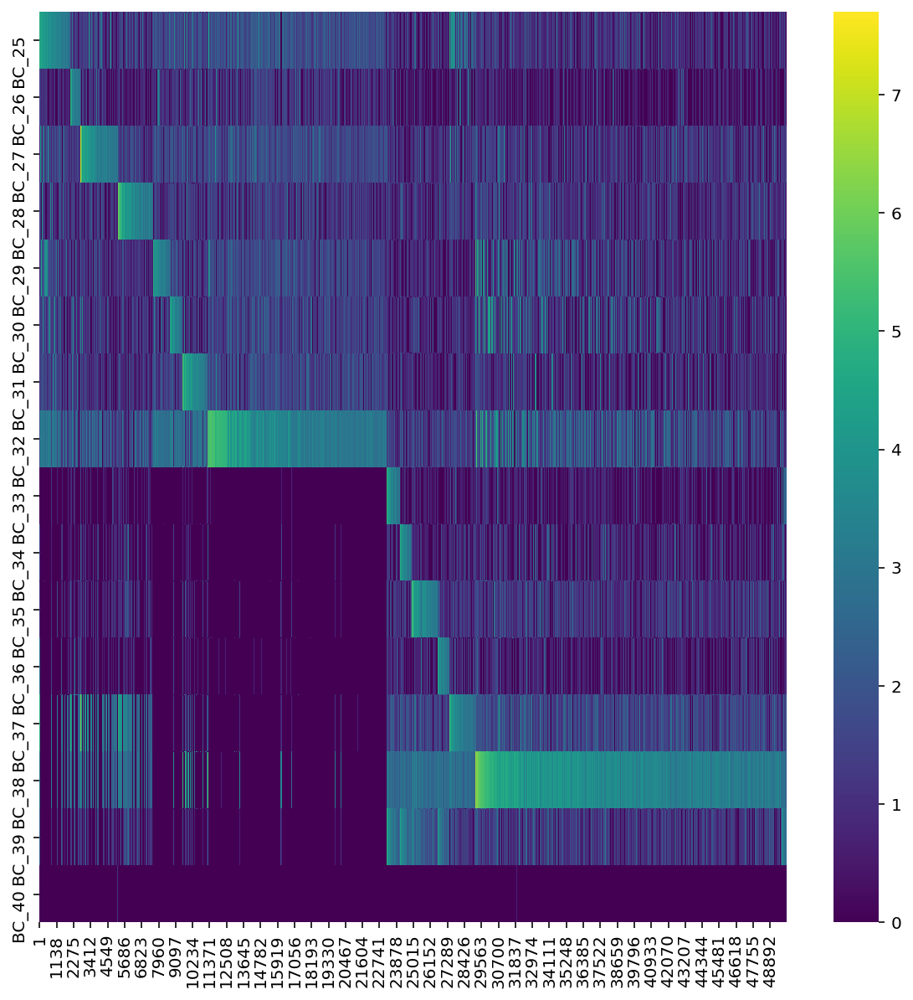

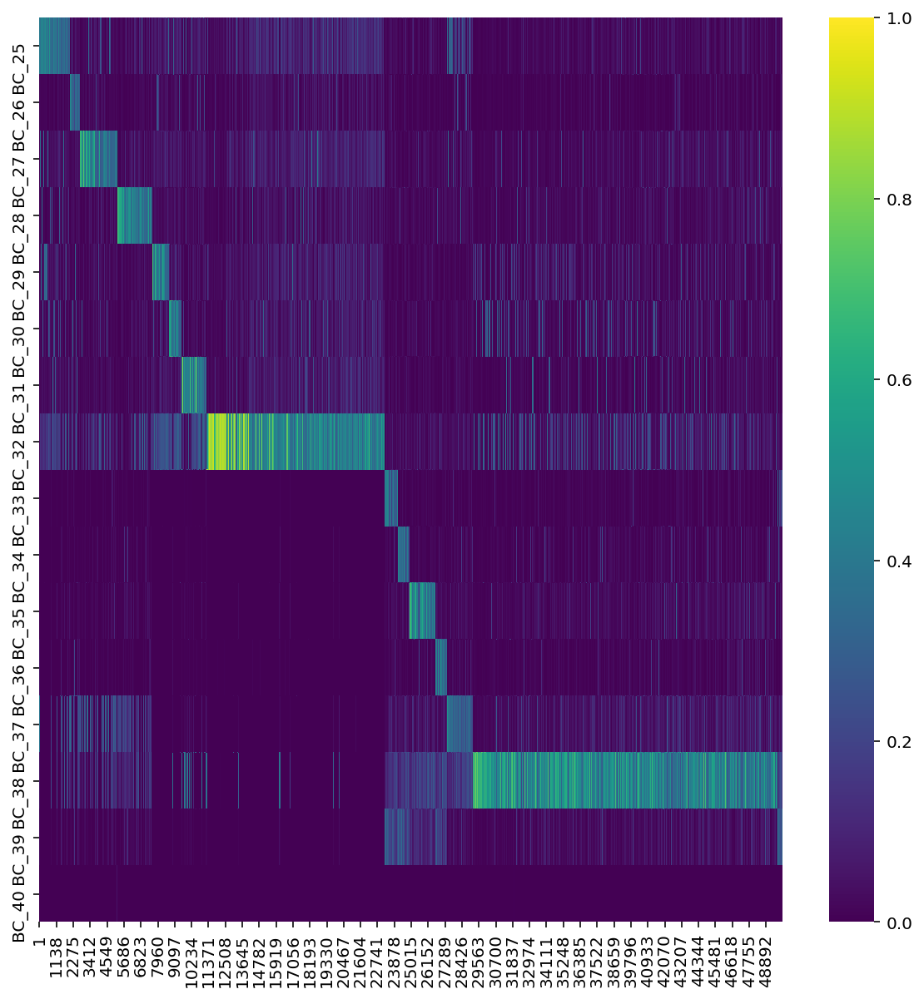

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,...,49961,49962,49963,49964,49965,49966,49967,49968,49969,49970,49971,49972,49973,49974,49975,49976,49977,49978,49979,49980,49981,49982,49983,49984,49985,49986,49987,49988,49989,49990,49991,49992,49993,49994,49995,49996,49997,49998,49999,50000
BC_25,1025,435,344,235,231,205,220,204,199,226,171,236,183,172,128,127,163,171,180,135,174,152,188,110,134,185,162,201,172,165,137,171,144,133,146,121,145,137,133,142,...,1,2,0,1,2,3,1,1,2,0,1,2,3,1,3,0,3,3,3,2,0,0,0,4,1,3,1,0,0,2,1,0,0,2,0,2,1,2,0,4
BC_26,2,9,3,2,3,0,5,3,0,0,0,4,1,1,2,2,3,1,5,7,2,3,4,47,4,3,0,1,2,4,2,3,0,3,4,2,3,0,2,3,...,1,0,1,1,1,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,1,1,0,0,1,1,2,0,1,0,1,0,0,0,0,0,0,8,0
BC_27,10,4,8,26,11,3,6,14,13,7,0,9,6,14,7,5,6,5,4,5,157,38,1,4,10,2,7,7,5,6,2,3,7,1,2,4,3,4,45,123,...,1,2,5,3,0,6,1,0,2,0,1,4,1,0,1,1,0,1,1,5,2,1,1,2,1,5,2,2,2,2,3,3,3,0,1,3,3,1,2,2
BC_28,15,11,5,5,4,9,0,5,3,4,3,4,2,6,3,6,11,7,1,1,2,6,1,2,109,3,2,2,4,2,7,6,2,3,4,13,2,4,2,6,...,1,1,2,1,2,2,1,3,1,1,3,2,1,2,1,2,1,1,0,1,3,1,2,0,6,5,4,1,1,3,2,2,2,1,0,1,1,2,3,0
BC_29,7,5,8,223,11,14,8,1,10,3,7,7,4,3,125,1,3,3,158,6,4,12,136,4,33,131,3,4,4,112,3,115,3,1,50,6,3,3,47,1,...,0,0,1,1,4,2,1,2,3,3,1,5,0,0,2,1,2,1,2,1,1,2,3,0,0,2,1,1,1,2,0,0,0,1,1,2,3,2,0,0
BC_30,14,4,7,1,2,4,3,5,4,1,4,132,1,4,64,2,2,1,6,7,7,96,3,48,4,0,2,2,1,9,8,3,3,2,6,4,2,1,10,5,...,1,0,0,1,2,3,0,0,1,1,1,0,0,1,2,1,1,2,1,0,0,1,1,0,0,2,1,1,0,1,0,0,2,1,1,6,0,1,0,0
BC_31,7,9,269,5,225,3,138,2,4,1,5,9,6,4,7,37,1,1,3,4,8,11,5,106,3,5,4,3,0,6,8,13,6,2,81,2,126,1,28,2,...,1,4,1,1,0,3,1,0,1,2,3,3,5,2,1,2,1,0,2,1,0,0,3,2,2,1,1,0,1,1,3,0,1,1,1,0,1,0,1,2
BC_32,16,20,11,26,41,10,91,5,8,8,18,18,7,5,20,10,7,4,19,21,23,33,19,25,19,16,6,4,5,27,8,17,5,5,19,8,22,4,39,22,...,3,3,3,4,1,2,0,2,5,5,5,0,2,4,3,2,1,0,0,4,1,3,0,4,6,4,4,5,3,3,7,5,2,1,1,2,3,2,3,2
BC_33,4,4,0,0,0,4,0,2,5,2,1,0,5,0,0,2,2,1,0,1,0,0,0,0,0,0,1,2,3,0,0,0,2,0,0,7,0,1,0,0,...,0,13,15,0,0,1,17,7,1,4,0,0,0,11,2,14,1,8,13,3,1,0,12,13,0,0,0,9,13,1,7,10,15,1,0,0,1,10,8,11
BC_34,10,7,0,0,0,2,0,3,2,2,8,0,1,5,0,4,2,3,0,8,0,0,0,0,0,0,1,1,1,0,1,0,0,4,0,2,0,1,0,0,...,14,2,0,1,13,9,2,1,7,11,11,8,2,0,12,1,2,5,2,1,14,15,0,2,1,9,12,1,2,11,2,2,0,15,15,9,3,0,1,2


In [ ]:
fig, ax = plt.subplots(figsize=(10,10))  
sns.heatmap(np.log1p(filtered_ClickTag_counts), cmap='viridis')
plt.show()

fig, ax = plt.subplots(figsize=(10,10))  
sns.heatmap(percentClickTags_counts, cmap='viridis')
plt.show()

filtered_ClickTag_counts




Cluster cells to find clear ClickTag 'expression'

In [ ]:
adata = sc.AnnData(ClickTag_counts_filtered)
adata.var_names= list(ClickTag_counts_filtered.columns)
adata.obs_names= list(ClickTag_counts_filtered[:50000].index)
#pd.read_csv(os.path.join(write_folder,'counted_tag_data/counted_data_jelly2_ClickTag_barcode_labels.csv'), header=None, sep=',')[:15000][0].tolist()


In [ ]:
adata

AnnData object with n_obs × n_vars = 50000 × 16

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


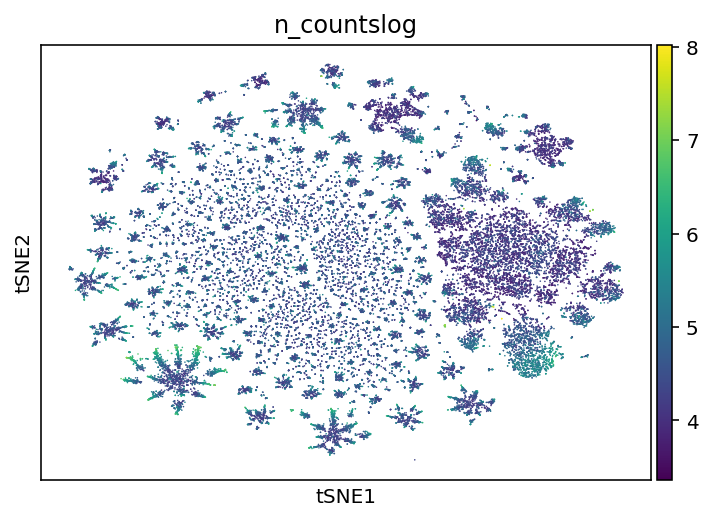

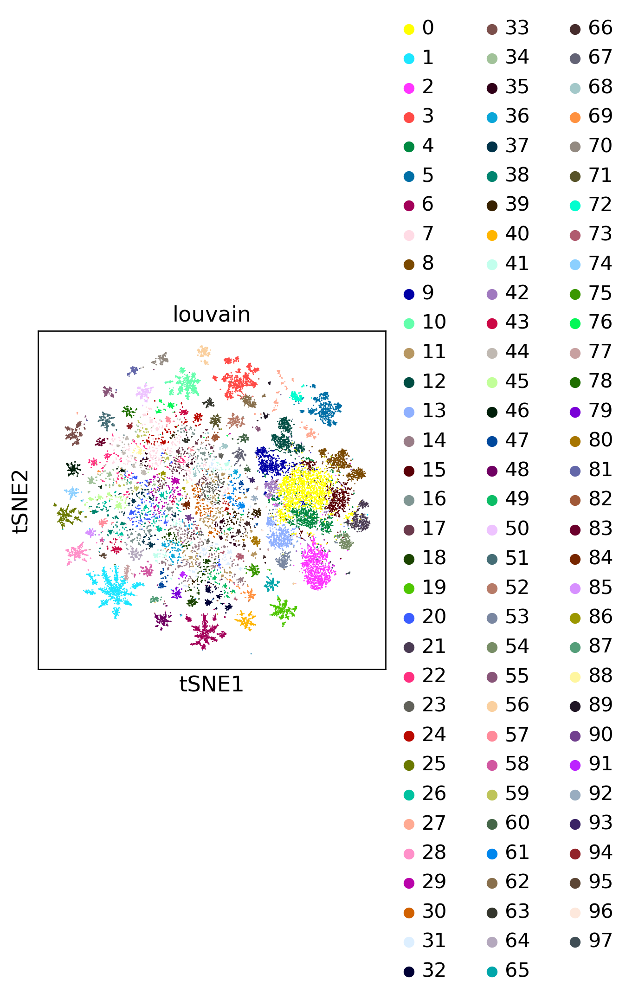

In [ ]:
adata

sc.pp.filter_genes(adata, min_counts=0)
sc.pp.normalize_per_cell(adata, counts_per_cell_after=10000)
adata.obs['n_countslog']=np.log(adata.obs['n_counts'])
sc.pp.log1p(adata)
sc.pp.regress_out(adata, ['n_counts'])
sc.tl.tsne(adata, perplexity=30, use_rep=None)




sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.louvain(adata, resolution=2)
sc.pl.tsne(adata, color='n_countslog')

sc.set_figure_params(dpi=120)
sc.pl.tsne(adata,color=['louvain'])



# sc.pl.tsne(adata, color=adata.var_names)

# for i in range(20):
#     sc.pl.violin(adata[adata.obs['louvain'].isin([str(i)])], keys=adata.var_names)

# sc.pl.tsne(adata, color=['louvain'],palette='rainbow',legend_loc='on data')


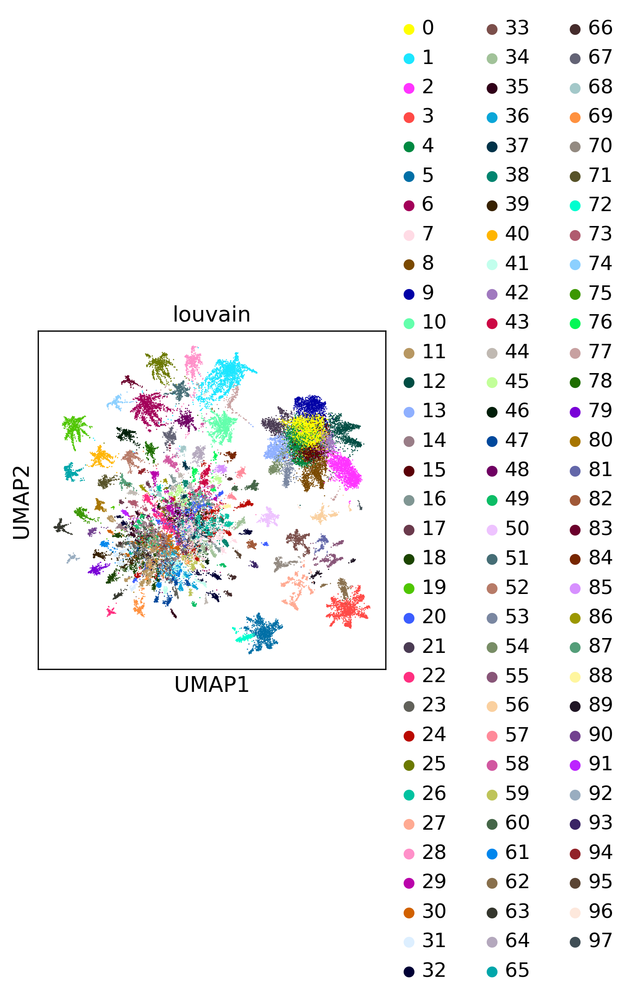

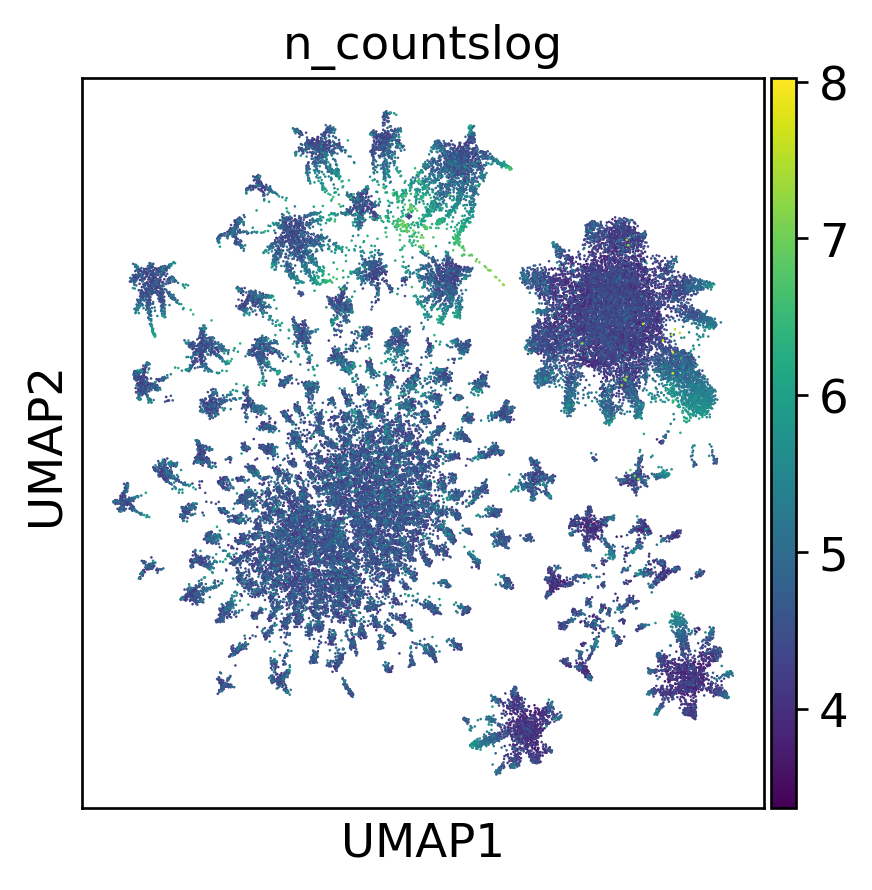

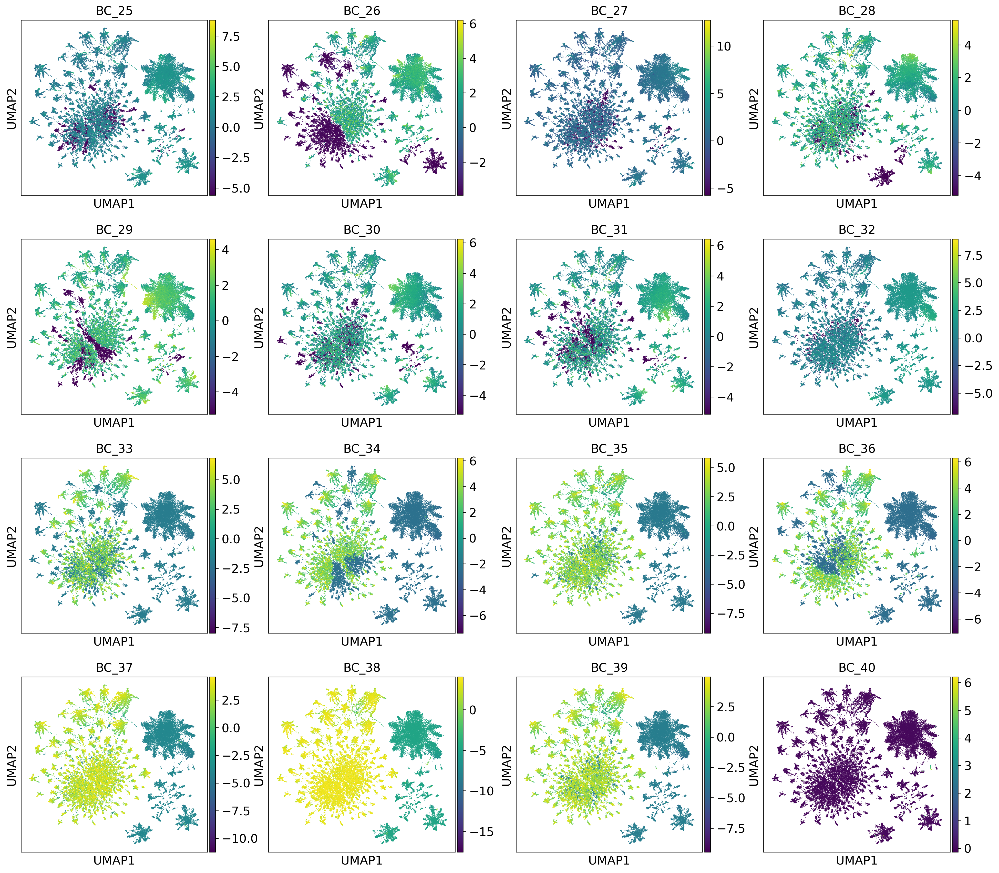

In [ ]:
sc.pl.umap(adata, color='louvain')
sc.pl.umap(adata, color='n_countslog')
sc.pl.umap(adata, color=adata.var_names)

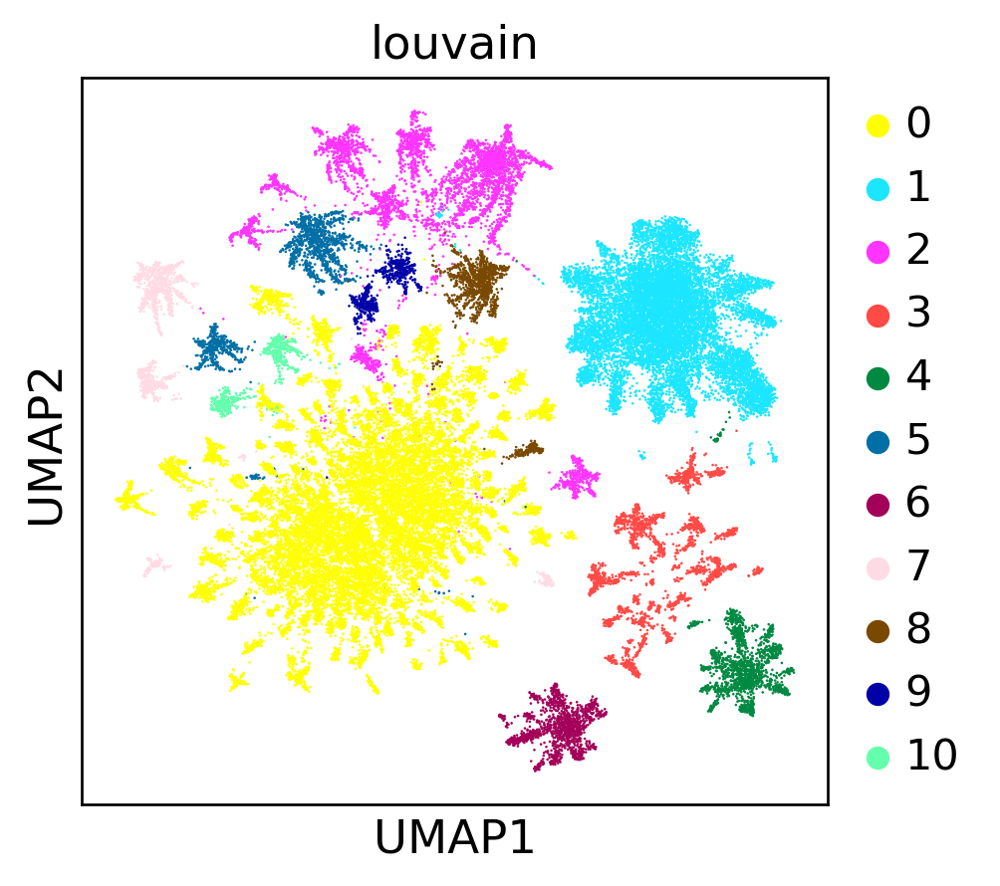

In [ ]:
sc.tl.louvain(adata, resolution=0.11)#0.15
sc.pl.umap(adata, color='louvain')
#adata.write('adata.h5ad')

### **Read in previously saved ClickTag Adata to Filter for 'Real' Cells'**

/usr/local/lib/python3.6/dist-packages/anndata/compat/__init__.py:182: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning,
/usr/local/lib/python3.6/dist-packages/anndata/compat/__init__.py:182: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  FutureWarning,


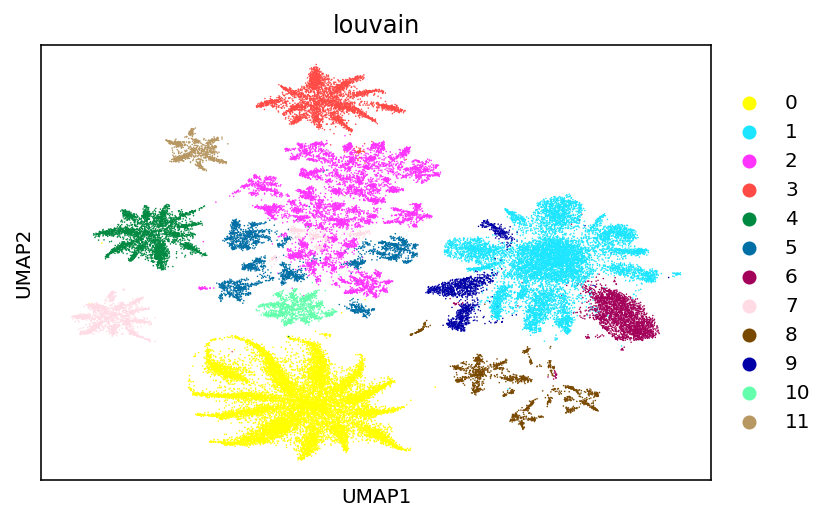

In [ ]:
adata = anndata.read('D1.1838')
sc.pl.umap(adata, color='louvain')

In [ ]:
sub1=adata[adata.obs['louvain'].isin(['0'])]
sub2=adata[adata.obs['louvain'].isin(['1','6','9'])]
sub3=adata[adata.obs['louvain'].isin(['3'])]
sub4=adata[adata.obs['louvain'].isin(['4'])]
sub5=adata[adata.obs['louvain'].isin(['5'])]
sub6=adata[adata.obs['louvain'].isin(['7'])]
sub7=adata[adata.obs['louvain'].isin(['8'])]
sub8=adata[adata.obs['louvain'].isin(['10'])]
sub9=adata[adata.obs['louvain'].isin(['11'])]

Trying to set attribute `.obs` of view, copying.


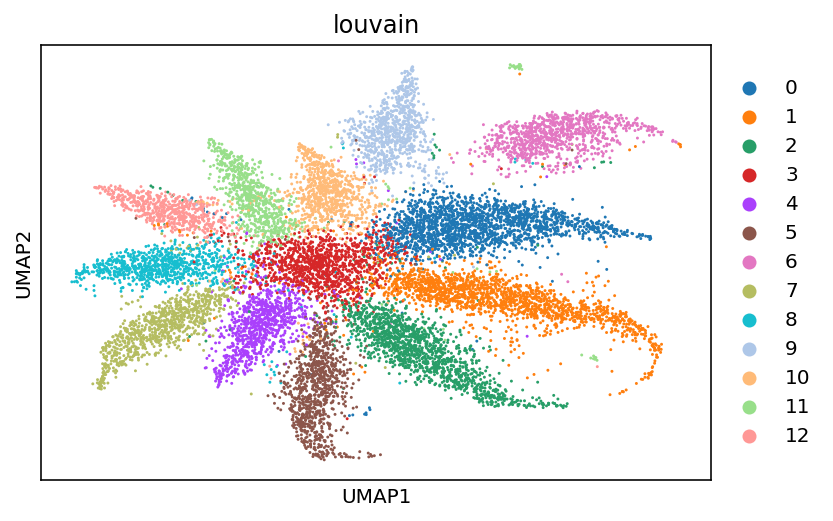

In [ ]:
sc.tl.louvain(sub1, resolution=0.5)
sc.tl.umap(sub1)
sc.pl.umap(sub1, color='louvain')

In [ ]:
sc.tl.louvain(sub1, resolution=0.5)
sc.tl.umap(sub1)
sc.pl.umap(sub1, color='louvain')

sub1dict={}
sc.pl.umap(sub1, color=sub1.var_names)

sub1keeps = sub1[~sub1.obs['louvain'].isin(['3'])]
sc.pl.umap(sub1keeps, color='louvain')

sub1keeps_orgIDdict={'0':'8', '1':'5', '2':'6','4':'3', '5':'4', '6':'7', '7':'1', '8':'2', '9':'9', '10':'10', '11':'11','12':'12','louvain':'org'}
sub1keeps.obs['orgID']=[sub1keeps_orgIDdict.get(x) for x in list(sub1keeps.obs['louvain'])]

sc.pl.umap(sub1keeps, color=['orgID'])
sc.pl.umap(sub1keeps, color=sub1.var_names)



In [ ]:
sc.tl.louvain(sub2, resolution=0.5)
sc.tl.umap(sub2)
sc.pl.umap(sub2, color=['louvain', 'n_countslog'])

# Skip to sub 3
sc.tl.louvain(sub3, resolution=0.5)
sc.tl.umap(sub3)
sc.pl.umap(sub3, color='louvain')

sc.pl.umap(sub3, color=sub1.var_names)


sub3_orgIDdict={'0':'5', '1':'8', '2':'6', '3':'11', '4':'3', '5':'7', '6':'1', '7':'9', '8':'4', '9':'10', '10':'12', 'louvain':'org'}
sub3.obs['orgID']=[sub3_orgIDdict.get(x) for x in list(sub3.obs['louvain'])]


sc.pl.umap(sub3, color=['orgID'])
sc.pl.umap(sub3, color=sub1.var_names)

sub3




In [ ]:
sc.tl.louvain(sub4, resolution=0.5)
sc.tl.umap(sub4)
sc.pl.umap(sub4, color='louvain')

sc.pl.umap(sub4, color=sub1.var_names)

sub4

sub4_orgIDdict={'0':'8', '1':'5', '2':'6', '3':'3', '4':'12', '5':'7', '6':'4', '7':'2', '8':'11', '9':'10', '10':'1', 'louvain':'org'}
sub4.obs['orgID']=[sub4_orgIDdict.get(x) for x in list(sub4.obs['louvain'])]


sc.pl.umap(sub4, color=['orgID'])
sc.pl.umap(sub4, color=sub1.var_names)



In [ ]:
sc.tl.louvain(sub6, resolution=0.5)
sc.tl.umap(sub6)
sc.pl.umap(sub6, color='louvain')

sc.pl.umap(sub6, color=sub1.var_names)

sub6keeps=sub6[sub6.obs['louvain'].isin(['0','1','3','4','5','6','7','9','10','11','12'])]

sc.tl.louvain(sub6keeps, resolution=1)
sc.pl.umap(sub6keeps, color='louvain')

sub6keeps_orgIDdict={'0':'5', '1':'8', '2':'6', '3':'3', '4':'4', '5':'1', '6':'11', '7':'2', '8':'9', '9':'7', '10':'10', 'louvain':'org'}
sub6keeps.obs['orgID']=[sub6keeps_orgIDdict.get(x) for x in list(sub6keeps.obs['louvain'])]


sc.pl.umap(sub6keeps, color=['orgID'])
sc.pl.umap(sub6keeps, color=sub1.var_names)



In [ ]:
sc.tl.louvain(sub8, resolution=0.7)
sc.tl.umap(sub8)
sc.pl.umap(sub8, color='louvain')

sc.pl.umap(sub8, color=sub1.var_names)

sub8

sub8keeps=sub8[~sub8.obs['louvain'].isin(['2'])]
sc.tl.louvain(sub8keeps, resolution=1)
sc.pl.umap(sub8keeps, color='louvain')


sub8keeps_orgIDdict={'0':'8', '1':'5', '2':'6', '3':'3', '4':'4', '5':'1', '6':'11', '7':'9', '8':'2', '9':'7', 'louvain':'org'}
sub8keeps.obs['orgID']=[sub8keeps_orgIDdict.get(x) for x in list(sub8keeps.obs['louvain'])]


sc.pl.umap(sub8keeps, color=['orgID'])
sc.pl.umap(sub8keeps, color=sub1.var_names)


sub8rejects=sub8[sub8.obs['louvain'].isin(['2'])]
sc.tl.louvain(sub8rejects, resolution=0.2)
sc.pl.umap(sub8rejects, color=['louvain', 'BC_36'])

sub8rejects=sub8rejects[sub8rejects.obs['louvain'].isin(['0'])]
sub8rejects_orgIDdict={'0':'12', 'louvain':'org'}
sub8rejects.obs['orgID']=[sub8rejects_orgIDdict.get(x) for x in list(sub8rejects.obs['louvain'])]



In [ ]:
sc.tl.louvain(sub9, resolution=1.2)
sc.tl.umap(sub9)
sc.pl.umap(sub9, color='louvain')

sc.pl.umap(sub9, color=sub1.var_names)

sub9

sub9_orgIDdict={'0':'8', '1':'6', '2':'5', '3':'10', '4':'7', '5':'4', '6':'11', '7':'3', '8':'1', '9':'12', 'louvain':'org'}
sub9.obs['orgID']=[sub9_orgIDdict.get(x) for x in list(sub9.obs['louvain'])]


sc.pl.umap(sub9, color=['orgID'])
sc.pl.umap(sub9, color=sub1.var_names)



In [ ]:
selected_cells=sub1keeps.obs['orgID']
selected_cells = selected_cells.append(sub3.obs['orgID'])
selected_cells = selected_cells.append(sub4.obs['orgID'])
selected_cells = selected_cells.append(sub6keeps.obs['orgID'])
selected_cells = selected_cells.append(sub8keeps.obs['orgID'])
selected_cells = selected_cells.append(sub8rejects.obs['orgID'])
selected_cells = selected_cells.append(sub9.obs['orgID'])


#selected_cells
sio.savemat('041519_jelly4stim_individs_tagCells_50k.mat', selected_cells)
#adata.write('adata.h5ad')